In [1]:
import csv
import numpy as np
import matplotlib.pyplot as plt
import math 
from math import cos

In [2]:
import pandas as pd

In [3]:
pip install haversine

Note: you may need to restart the kernel to use updated packages.


In [4]:
venice = [45.436482, 12.331460] 

In [5]:
coords = []
colours = []
with open('flickrCoordinates2.csv', 'r') as csvfile:
    reader = csv.reader(csvfile)
    for r in reader:
        colour = [int(r[2][i:i+2], 16) for i in (0, 2, 4)]
        colours.append(colour)
        
        coords.append([eval(r[0]), eval(r[1])])

In [6]:
coords

[[45.429294, 12.343171],
 [45.434444, 12.339287],
 [45.439537, 12.313613],
 [45.439778, 12.334556],
 [45.439778, 12.334556],
 [45.439537, 12.313613],
 [45.439778, 12.334556],
 [45.434215, 12.33873],
 [45.433823, 12.339566],
 [45.433296, 12.339717],
 [45.4342, 12.340682],
 [45.436684, 12.333],
 [45.431941, 12.328602],
 [45.430751, 12.334824],
 [45.43508, 12.328376],
 [45.433951, 12.337726],
 [45.433451, 12.335355],
 [45.43706, 12.334068],
 [45.43706, 12.334068],
 [45.43706, 12.334068],
 [45.43706, 12.334068],
 [45.433451, 12.335355],
 [45.439778, 12.334556],
 [45.430864, 12.330265],
 [45.43484, 12.342367],
 [45.430864, 12.330265],
 [45.43959, 12.342056],
 [45.434486, 12.339255],
 [45.419901, 12.329235],
 [45.434486, 12.339255],
 [45.433198, 12.339341],
 [45.433198, 12.339341],
 [45.433974, 12.337024],
 [45.434486, 12.339255],
 [45.431828, 12.328634],
 [45.438758, 12.339658],
 [45.438758, 12.339658],
 [45.437422, 12.340312],
 [45.437422, 12.340312],
 [45.437422, 12.340312],
 [45.433883, 

In [7]:
from haversine import haversine, Unit

refmain = venice
refsecond = coords[1]

haversine(refmain, refsecond, unit='m')

651.4059836136513

In [8]:
def convertDistToMetre(mainCoord, listofCoords):
    distances = []
    for i in listofCoords:
        distance = haversine(mainCoord, i, unit='m')
        distances.append(distance)
    return distances

In [10]:
distances = convertDistToMetre(venice, coords)

In [11]:
distances

[1214.0392209480995,
 651.4059836136513,
 1433.320829031802,
 438.9450336147344,
 438.9450336147344,
 1433.320829031802,
 438.9450336147344,
 620.7451196907584,
 698.1854167174658,
 735.2522098872755,
 762.9960203309483,
 122.24044699390494,
 551.9899351404114,
 689.2029360382379,
 286.71938690341767,
 564.1341012777336,
 453.8245119764892,
 213.3980559620787,
 213.3980559620787,
 213.3980559620787,
 213.3980559620787,
 453.8245119764892,
 438.9450336147344,
 631.614759191522,
 870.4022795010843,
 631.614759191522,
 896.0622417173641,
 647.4496861632446,
 1851.8834640765554,
 647.4496861632446,
 715.1873271224719,
 715.1873271224719,
 515.997392147884,
 647.4496861632446,
 562.5233804465889,
 687.8876316451044,
 687.8876316451044,
 698.5405399248224,
 698.5405399248224,
 698.5405399248224,
 1101.4011306877105,
 1101.4011306877105,
 1101.4011306877105,
 1101.4011306877105,
 1232.6075267819028,
 596.365052836315,
 596.365052836315,
 384.1233870822501,
 596.365052836315,
 596.365052836315

In [12]:
def get_bearing(lat1, long1, lat2, long2):
    lat1 = np.deg2rad(lat1)
    lat2 = np.deg2rad(lat2)
    long1 = np.deg2rad(long1)
    long2 = np.deg2rad(long2)
    
    dLon = long2 - long1
    y = math.sin(dLon) * math.cos(lat2)
    x = math.cos(lat1) * math.sin(lat2) - math.sin(lat1) * math.cos(lat2) * math.cos(dLon)
  
    brng = math.atan2(y, x)
    brng = np.rad2deg(brng)
    brng = (brng + 360) % 360

    return brng

In [13]:
def getListOfBearings(mainCoord,coordinates):
    bearings = []
    for c in coordinates:
        lat = c[0]
        lon = c[1]
        bearing = get_bearing(mainCoord[0],mainCoord[1],lat,lon)
        bearings.append(bearing)
    return bearings

In [14]:
bearings = getListOfBearings(venice,coords)

In [15]:
newPoints = []
for i in range(len(bearings)):
    angle = bearings[i]
    distance = distances[i]
    px = distance * math.sin(np.deg2rad(angle))
    py = distance * math.cos(np.deg2rad(angle))
    newPoints.append([px,py])
newPoints

[[913.8734485473633, -799.2036974641809],
 [610.7279317580221, -226.58585317322274],
 [-1392.446354096993, 339.8554838433595],
 [241.55295194489614, 366.50363428177224],
 [241.55295194489614, 366.50363428177224],
 [-1392.446354096993, 339.8554838433595],
 [241.55295194489614, 366.50363428177224],
 [567.2684402691164, -252.05360599391943],
 [632.5048027679909, -295.6358411836533],
 [644.2932305109579, -354.2344495695978],
 [719.580597292826, -253.70591447690907],
 [120.15889657719616, 22.462556724922457],
 [-223.0149288137843, -504.932896554085],
 [262.50456234253875, -637.2535145396059],
 [-240.63673399840235, -155.8908883702119],
 [488.92994171670324, -281.415700196946],
 [303.92578948258637, -337.02492809595725],
 [203.4885156798382, 64.27405600093022],
 [203.4885156798382, 64.27405600093022],
 [203.4885156798382, 64.27405600093022],
 [203.4885156798382, 64.27405600093022],
 [303.92578948258637, -337.02492809595725],
 [241.55295194489614, 366.50363428177224],
 [-93.24979905249755, -6

In [49]:
newPoints[ 0]

[913.8734485473633, -799.2036974641809]

In [53]:
lim_newPoints = [-2000,-2000,2000,2000]

In [16]:
colours = np.array(colours)

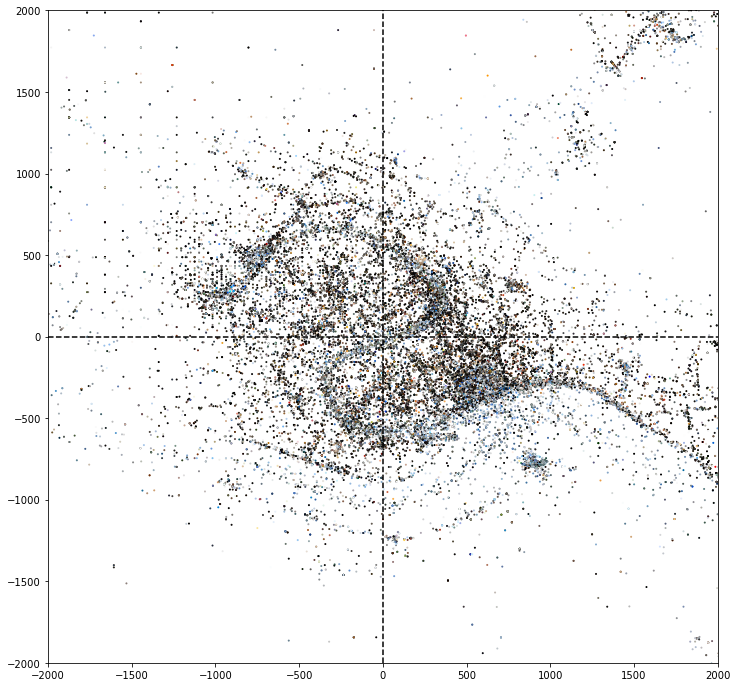

In [17]:
fig, ax = plt.subplots(figsize = (12,12))
ax.scatter([p[0] for p in newPoints], [p[1] for p in newPoints], c = colours/255.0, s = 1)
plt.axvline(0,c= 'black', ls = '--')
plt.axhline(0,c= 'black', ls = '--')

plt.xlim([-2000,2000])
plt.ylim([-2000,2000])

plt.show()

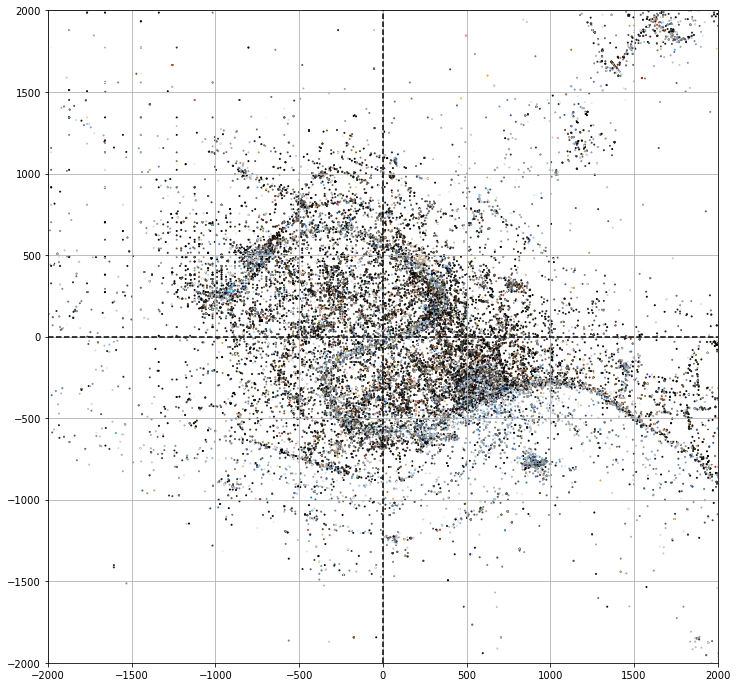

In [54]:
fig, ax = plt.subplots(figsize = (12,12))
ax.scatter([p[0] for p in newPoints], [p[1] for p in newPoints], c = colours/255.0, s = 1)
plt.axvline(0,c= 'black', ls = '--')
plt.axhline(0,c= 'black', ls = '--')
ax.grid(True)
plt.ylim([lim_newPoints[0], lim_newPoints[2]])
plt.xlim([lim_newPoints[1], lim_newPoints[3]])
plt.show()

In [55]:
from scipy import stats
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [68]:
def testIfUniform(latrange, lonrange, newPoints):
    pointsInRange = []
    for c in newPoints:
        if (latrange[0] <= c[0] and c[0]<latrange[1] and 
            lonrange[0] <= c[1] and c[1]<lonrange[1]):
            pointsInRange.append(c)
    
    pointsInRange = np.asarray(pointsInRange)
    scaler = MinMaxScaler()
    normalised = scaler.fit_transform(pointsInRange)
    print(stats.kstest(normalised[:,0], 'uniform'))
    print(stats.kstest(normalised[:,1], 'uniform'))

In [69]:
testIfUniform([-2000,2000], [-2000,2000], newPoints)

KstestResult(statistic=0.23181963600650266, pvalue=0.0)
KstestResult(statistic=0.27795867543883523, pvalue=0.0)


# start giving it a return value so that we can start using it

In [70]:
def testIfUniform(latrange, lonrange, coordinates, statThresh, pThresh):
    pointsInRange = []
    for c in coordinates:
        if (latrange[0] <= c[0] and c[0]<latrange[1] and 
            lonrange[0] <= c[1] and c[1]<lonrange[1]):
            pointsInRange.append(c)
    
    if len(pointsInRange) > 2 and min(latrange[1]-latrange[0], lonrange[1]-lonrange[0]) > 0.00005:
        points = np.asarray(pointsInRange)
        scaler = MinMaxScaler()
        normalised = scaler.fit_transform(pointsInRange)
        
        xKS = stats.kstest(normalised[:,0], 'uniform')
        yKS = stats.kstest(normalised[:,1], 'uniform')
        
        if xKS[0] < statThresh and yKS[0] < statThresh and xKS[1] > pThresh and yKS[1] > pThresh:
            return True, pointsInRange
        else:
            return False, pointsInRange
        
    else:
        return True, pointsInRange

In [71]:
def evaluate(latrange, lonrange, coordinates, statThresh = 0.7, pThresh = 0.05):
    uniform, inrange = testIfUniform(latrange, lonrange, coordinates, statThresh, pThresh)
    latdiff = latrange[1]-latrange[0]
    londiff = lonrange[1]-lonrange[0]
    
    if uniform:
        return [(latrange[0], lonrange[0]), (latdiff, londiff), inrange]
    else:
        a = evaluate([latrange[0],latrange[0]+latdiff/2], [lonrange[0],lonrange[0]+londiff/2], inrange, statThresh, pThresh)
        b = evaluate([latrange[0]+latdiff/2,latrange[1]], [lonrange[0],lonrange[0]+londiff/2], inrange, statThresh, pThresh)
        c = evaluate([latrange[0],latrange[0]+latdiff/2], [lonrange[0]+londiff/2,lonrange[1]], inrange, statThresh, pThresh)
        d = evaluate([latrange[0]+latdiff/2,latrange[1]], [lonrange[0]+londiff/2,lonrange[1]], inrange, statThresh, pThresh)
        
        return[a,b,c,d]

In [72]:
def unpack(tree, squares):
    if len(tree) == 4:
        for t in tree:
            unpack(t, squares)
    else:
        squares.append(tree)

In [82]:
squares = evaluate([-2000,2000], [-2000,2000], newPoints, statThresh = 0.8, pThresh = 0.01)

In [83]:
blocks = []
unpack(squares, blocks)

In [84]:
len(blocks)

81754

In [85]:
print(blocks)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [86]:
squares

[[[(-2000, -2000),
   (1000.0, 1000.0),
   [[-1031.0464348842972, -1053.2663037150378],
    [-1607.1387532850915, -1401.4082280248927],
    [-1607.1387532850915, -1401.4082280248927],
    [-1607.1421981587741, -1414.8628324348397],
    [-1174.1869908386618, -1147.8681713948467],
    [-1531.8545390748002, -1513.066918411944],
    [-1158.3446016428052, -1146.2031890481344],
    [-1017.6607120436197, -1280.9960167567058]]],
  [[(-1000.0, -2000),
    (500.0, 500.0),
    [[-562.2629176300825, -1863.8267530491676]]],
   [[(-500.0, -2000),
     (250.0, 250.0),
     [[-321.09274063375227, -1870.5154273146989]]],
    [[(-250.0, -2000), (125.0, 125.0), []],
     [(-125.0, -2000), (125.0, 125.0), []],
     [[(-250.0, -1875.0), (62.5, 62.5), []],
      [[(-187.5, -1875.0), (31.25, 31.25), []],
       [(-156.25, -1875.0), (31.25, 31.25), []],
       [[[(-187.5, -1843.75), (7.8125, 7.8125), []],
         [[(-179.6875, -1843.75), (3.90625, 3.90625), []],
          [[(-175.78125, -1843.75), (1.953125,

In [87]:
blocks = []
unpack(squares, blocks)

In [88]:
len(blocks)

81754

In [89]:
blocks[0]

[(-2000, -2000),
 (1000.0, 1000.0),
 [[-1031.0464348842972, -1053.2663037150378],
  [-1607.1387532850915, -1401.4082280248927],
  [-1607.1387532850915, -1401.4082280248927],
  [-1607.1421981587741, -1414.8628324348397],
  [-1174.1869908386618, -1147.8681713948467],
  [-1531.8545390748002, -1513.066918411944],
  [-1158.3446016428052, -1146.2031890481344],
  [-1017.6607120436197, -1280.9960167567058]]]

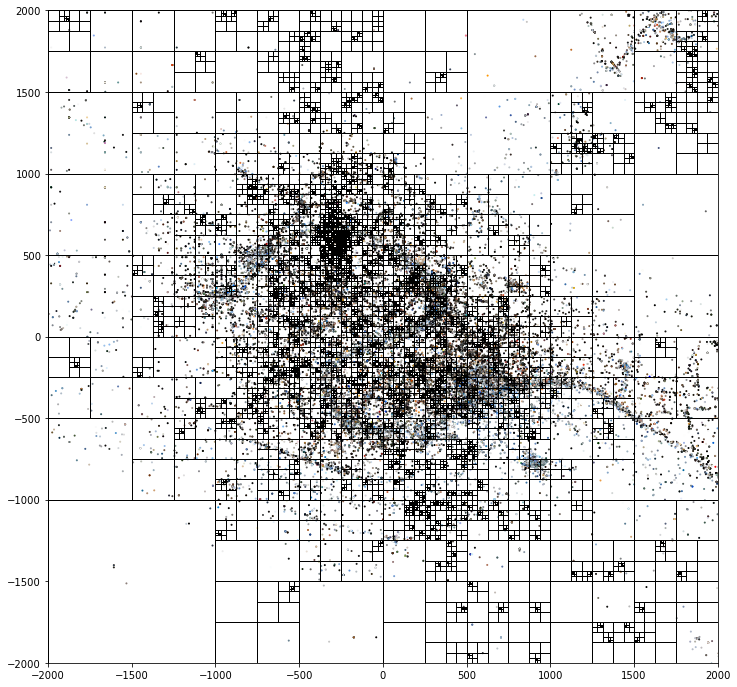

In [90]:
from matplotlib.patches import Rectangle
fig, ax = plt.subplots(figsize = (12,12))
ax.scatter([p[0] for p in newPoints], [p[1] for p in newPoints], c = colours/255.0, s = 1)
#plt.axvline(0,c= 'black', ls = '--')
#plt.axhline(0,c= 'black', ls = '--')
for b in blocks:
    ax.add_patch(Rectangle((b[0][1],b[0][0]), b[1][1], b[1][0],
                           edgecolor = 'black',
                           fill=False,lw=1))
plt.ylim([-2000,2000])
plt.xlim([-2000,2000])
plt.show()


In [104]:
blocks.sort(key = lambda x:x[1][0]*x[1][1], reverse = True)

In [105]:
def sharesBorder(s1, s2):
    s1lim = [s1[0][0], s1[0][1], s1[0][0]+s1[1][0], s1[0][1]+s1[1][1]]
    s2lim = [s2[0][0], s2[0][1], s2[0][0]+s2[1][0], s2[0][1]+s2[1][1]]
    
    lBorders = [[(s1lim[0], s1lim[1]), (s1lim[2], s1lim[1])],
                [(s1lim[0], s1lim[3]), (s1lim[2], s1lim[3])],
                [(s1lim[0], s1lim[1]), (s1lim[0], s1lim[3])],
                [(s1lim[2], s1lim[1]), (s1lim[2], s1lim[3])]
                ]
    rBorders = [[(s2lim[0], s2lim[1]), (s2lim[2], s2lim[1])],
                [(s2lim[0], s2lim[3]), (s2lim[2], s2lim[3])],
                [(s2lim[0], s2lim[1]), (s2lim[0], s2lim[3])],
                [(s2lim[2], s2lim[1]), (s2lim[2], s2lim[3])]
                ]

    for lb in lBorders:
        for rb in rBorders:
            if checkOverlap(lb, rb):
                return True

def checkOverlap(a, b):
    if a[0][0] == b[0][0] == a[1][0] == b[1][0]:
        return a[1][1] > b[0][1] and b[1][1] > a[0][1]
    elif a[0][1] == b[0][1] == a[1][1] == b[1][1]:
        return a[1][0] > b[0][0] and b[1][0] > a[0][0]

In [106]:
def matchDensity(b1, b2, ta = 0.18511, tc = 0.00004):
    area1 = b1[1][0]*b1[1][1]
    area2 = b2[1][0]*b2[1][1]
    if len(b1[2]) and len(b2[2]):
        d1 = (area1/len(b1[2]))*100000
        d2 = (area2/len(b2[2]))*100000

        t = ta * min(d1, d2) + tc

        if abs(d1 - d2) < t:
                return True
        else:
            return False
    elif len(b1[2]) == len(b2[2]) == 0:
            return True
    else:
        return False

In [107]:
def addToGroup(group, blocks):
    added = True
    while added:
        found = False
        for g in group:
            for b in blocks:
                if sharesBorder(g,b) and matchDensity(g,b):
                    found = True
                    group.append(b)
                    blocks.remove(b)
        added = found

In [108]:
blocks = []
unpack(squares, blocks)

In [111]:
groups = []
while len(blocks) > 0:
    group = [blocks[0]]
    blocks.remove(blocks[0])
    addToGroup(group,blocks)
    groups.append(group)  

In [112]:
print(len(groups))

6872


In [113]:
print(groups[0])

[[(-582.259327173233, -1193.985790014267), (2.9802322387695312e-05, 2.9802322387695312e-05), [[-582.2593001972765, -1193.9857629191354], [-582.2593001972765, -1193.9857629191354], [-582.2593001972765, -1193.9857629191354], [-582.2593001972765, -1193.9857629191354], [-582.2593001972765, -1193.9857629191354]]]]


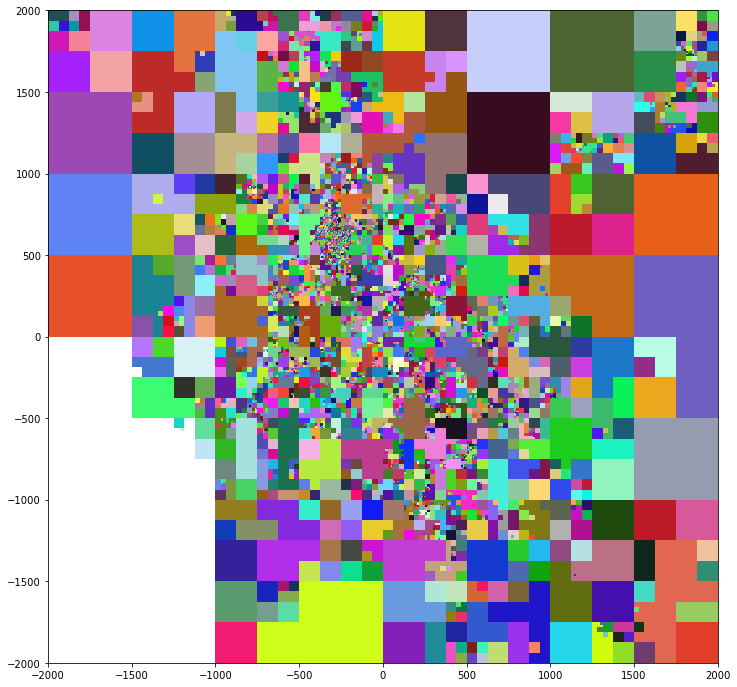

In [114]:
from matplotlib.patches import Rectangle
import random

fig, ax = plt.subplots(figsize = (12,12))
#ax.scatter([p[0] for p in newPoints], [p[1] for p in newPoints], c = colours/255.0, s = 1)

for g in groups:
    colour = np.array(random.sample(range(10, 255), 3))/255
    for b in g:
        ax.add_patch(Rectangle((b[0][1],b[0][0]), b[1][1], b[1][0],
                               facecolor = colour,
                               fill=True))
plt.ylim([-2000,2000])
plt.xlim([-2000,2000])
plt.show()

In [115]:
groups.sort(key = lambda x : len(x), reverse = True)

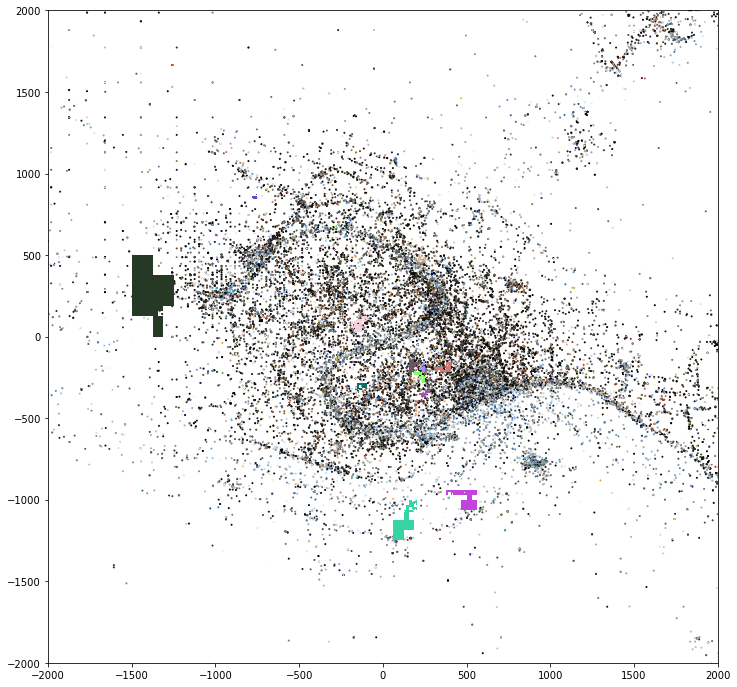

In [116]:
from matplotlib.patches import Rectangle
import random

fig, ax = plt.subplots(figsize = (12,12))
ax.scatter([p[0] for p in newPoints], [p[1] for p in newPoints], c = colours/255.0, s = 1)

for g in groups[0:20]:
    colour = np.array(random.sample(range(10, 255), 3))/255
    for b in g:
        ax.add_patch(Rectangle((b[0][1],b[0][0]), b[1][1], b[1][0],
                               facecolor = colour,
                               fill=True))



plt.ylim([-2000,2000])
plt.xlim([-2000,2000])
plt.show()